In [ ]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
! kaggle competitions download uw-madison-gi-tract-image-segmentation

100% 2.30G/2.30G [00:11<00:00, 204MB/s]
100% 2.30G/2.30G [00:11<00:00, 211MB/s]


In [ ]:
! unzip /content/uw-madison-gi-tract-image-segmentation.zip

In [ ]:
! pip install monai

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 939 kB 5.1 MB/s 


In [ ]:
import numpy as np
import pandas as pd
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as tv_models
import matplotlib.pyplot as plt
import seaborn as sns
import cv2, torch, tqdm, os, torchvision, gc, warnings
from torchvision.models.resnet import ResNet, BasicBlock
from torch.utils.data import Dataset, DataLoader
from monai.metrics import compute_hausdorff_distance

In [ ]:
data_df_path = '/content/train.csv'
data_df = pd.read_csv(data_df_path)
data_df.head()

,id,class,segmentation
0,case123_day20_slice_0001,large_bowel,NaN
1,case123_day20_slice_0001,small_bowel,NaN
2,case123_day20_slice_0001,stomach,NaN
3,case123_day20_slice_0002,large_bowel,NaN
4,case123_day20_slice_0002,small_bowel,NaN


In [ ]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115488 entries, 0 to 115487
Data columns (total 3 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            115488 non-null  object
 1   class         115488 non-null  object
 2   segmentation  33913 non-null   object
dtypes: object(3)
memory usage: 2.6+ MB


In [ ]:
def long_to_wide(df):
    df = df.pivot(index='id', columns='class', values='segmentation')
    df['id'] = df.index
    df.index = [i for i in range(len(df))]
    return df

data_df = long_to_wide(data_df)
data_df.head()

class,large_bowel,small_bowel,stomach,id
0,NaN,NaN,NaN,case101_day20_slice_0001
1,NaN,NaN,NaN,case101_day20_slice_0002
2,NaN,NaN,NaN,case101_day20_slice_0003
3,NaN,NaN,NaN,case101_day20_slice_0004
4,NaN,NaN,NaN,case101_day20_slice_0005


In [ ]:
def get_info_from_path(path):
    case_day, filname = path.rsplit("/", maxsplit=3)[1::2]
    case, day = case_day.split('_')
    case_slice = filname.split('_')[0:2]
    case_slice = '_'.join(case_slice)
    img_id = '_'.join([case_day, case_slice])

    case = case.replace('case', '')
    day = day.replace('day', '')
    slice_no, width, height = filname.split('_')[1:4]
    
    return img_id, case, day, slice_no, width, height


def get_file_names(root_path: str, ext='.png'):
    image_paths = []
    image_properties = []
    for path, subdirs, files in tqdm.tqdm(os.walk(root_path)):
        for name in files:
            img_path = os.path.join(path, name)
            image_paths.append(img_path)
            properties = list(get_info_from_path(img_path))
            image_properties.append(properties)
                        
    return image_paths, image_properties

training_data_path = '/content/train'
image_paths, image_properties = get_file_names(training_data_path)

634it [00:00, 2503.09it/s]


In [ ]:
image_properties = np.array(image_properties)

img_df = pd.DataFrame()

img_df['id'] = image_properties[:, 0]
img_df['case'] = image_properties[:, 1].astype(int)
img_df['day'] = image_properties[:, 2].astype(int)
img_df['slice'] = image_properties[:, 3].astype(int)
img_df['width'] = image_properties[:, 4].astype(int)
img_df['height'] = image_properties[:, 5].astype(int)
img_df['path'] = image_paths

img_df.head()

,id,case,day,slice,width,height,path
0,case34_day16_slice_0025,34,16,25,276,276,/content/train/case34/case34_day16/scans/slice...
1,case34_day16_slice_0033,34,16,33,276,276,/content/train/case34/case34_day16/scans/slice...
2,case34_day16_slice_0054,34,16,54,276,276,/content/train/case34/case34_day16/scans/slice...
3,case34_day16_slice_0001,34,16,1,276,276,/content/train/case34/case34_day16/scans/slice...
4,case34_day16_slice_0026,34,16,26,276,276,/content/train/case34/case34_day16/scans/slice...


In [ ]:
data_df = data_df.merge(img_df, on='id', how='outer')
id_column = data_df.pop('id')
data_df.insert(0, 'id', id_column)

data_df.head()

,id,large_bowel,small_bowel,stomach,case,day,slice,width,height,path
0,case101_day20_slice_0001,NaN,NaN,NaN,101,20,1,266,266,/content/train/case101/case101_day20/scans/sli...
1,case101_day20_slice_0002,NaN,NaN,NaN,101,20,2,266,266,/content/train/case101/case101_day20/scans/sli...
2,case101_day20_slice_0003,NaN,NaN,NaN,101,20,3,266,266,/content/train/case101/case101_day20/scans/sli...
3,case101_day20_slice_0004,NaN,NaN,NaN,101,20,4,266,266,/content/train/case101/case101_day20/scans/sli...
4,case101_day20_slice_0005,NaN,NaN,NaN,101,20,5,266,266,/content/train/case101/case101_day20/scans/sli...


In [ ]:
lb_seg = data_df.large_bowel[94]
sb_seg = data_df.small_bowel[94]
stomach_seg = data_df.stomach[94]

print(
    f'tumor on large bowel mask\n: {lb_seg} \n\n', 
    f'tumor on small bowel mask\n: {sb_seg} \n\n',
    f'tumor on stomach mask\n: {stomach_seg} \n\n')

tumor on large bowel mask
: 24153 7 24417 11 24682 14 24948 14 25213 16 25479 17 25744 19 26009 21 26275 21 26540 23 26805 24 27071 24 27337 24 27603 24 27869 23 28135 23 28401 23 28667 22 28934 20 29052 6 29201 17 29317 9 29468 13 29582 11 29735 9 29848 11 30002 6 30114 12 30380 12 30544 14 30646 13 30809 16 30912 13 31074 18 31178 14 31339 19 31444 14 31605 19 31710 14 31871 20 31976 14 32137 20 32242 15 32403 19 32507 16 32669 19 32773 16 32935 19 33039 16 33201 19 33304 17 33467 19 33570 17 33734 18 33836 17 34001 17 34101 18 34268 15 34367 19 34536 13 34633 19 34803 11 34898 20 35071 9 35163 21 35338 7 35429 21 35694 22 35960 22 36225 22 36491 22 36755 24 37020 25 37286 24 37551 24 37816 25 38082 24 38347 24 38613 23 38879 23 39145 22 39411 22 39677 21 39943 21 40209 20 40476 18 40742 18 41008 17 41275 15 41541 15 41808 13 42075 11 42343 7 

 tumor on small bowel mask
: 26184 4 26449 7 26715 8 26980 11 27245 14 27510 19 27775 21 28041 21 28306 21 28571 21 28837 19 29103 18 29368 1

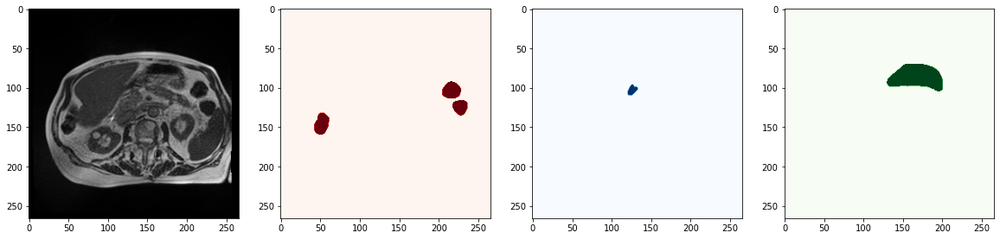

In [ ]:
def rle2mask(img_shape, rle):
    #correct order: (H, W)
    H, W = img_shape
    
    rle = rle.split()
    start_idx, lengths = np.array(rle[0::2], dtype=int), np.array(rle[1::2], dtype=int)
    end_idx = start_idx + (lengths - 1)
    
    mask = np.zeros(H*W, dtype=np.int8)

    for start, end in zip(start_idx, end_idx):
        mask[start:end] = 1

    mask = mask.reshape(H, W)
    return mask


idx = 90
sample_path = data_df.path[idx]
lb_seg = data_df.large_bowel[idx]
sb_seg = data_df.small_bowel[idx]
stomach_seg = data_df.stomach[idx]

sample_img = cv2.imread(sample_path, cv2.IMREAD_UNCHANGED)
img_shape = sample_img.shape

lb_seg_mask = rle2mask(img_shape, lb_seg)
sb_seg_mask = rle2mask(img_shape, sb_seg)
stomach_seg_mask = rle2mask(img_shape, stomach_seg)



fig, axs = plt.subplots(1, 4, figsize=(20, 8))

axs[0].imshow(sample_img, cmap='gray')
axs[1].imshow(lb_seg_mask, cmap='Reds')
axs[2].imshow(sb_seg_mask, cmap='Blues')
axs[3].imshow(stomach_seg_mask, cmap='Greens')

In [ ]:
data_df = data_df.sample(frac=1)
data_df.index = [i for i in range(len(data_df))]
data_df.head()

,id,large_bowel,small_bowel,stomach,case,day,slice,width,height,path
0,case85_day27_slice_0127,NaN,NaN,NaN,85,27,127,360,310,/content/train/case85/case85_day27/scans/slice...
1,case54_day39_slice_0030,NaN,NaN,NaN,54,39,30,266,266,/content/train/case54/case54_day39/scans/slice...
2,case144_day14_slice_0099,32246 3 32387 6 32509 8 32652 8 32774 10 32917...,26192 13 26427 3 26456 19 26690 12 26721 22 26...,NaN,144,14,99,266,266,/content/train/case144/case144_day14/scans/sli...
3,case133_day0_slice_0036,NaN,NaN,NaN,133,0,36,360,310,/content/train/case133/case133_day0/scans/slic...
4,case84_day0_slice_0038,NaN,NaN,NaN,84,0,38,266,266,/content/train/case84/case84_day0/scans/slice_...


In [ ]:
def check_empty(df):
  df['is_empty'] = False
  if pd.isna(df.large_bowel) and pd.isna(df.large_bowel) and pd.isna(df.stomach):
    df['is_empty'] = True
  return df

data_df = data_df.apply(check_empty, axis=1)
data_df.head()

,id,large_bowel,small_bowel,stomach,case,day,slice,width,height,path,is_empty
0,case85_day27_slice_0127,NaN,NaN,NaN,85,27,127,360,310,/content/train/case85/case85_day27/scans/slice...,True
1,case54_day39_slice_0030,NaN,NaN,NaN,54,39,30,266,266,/content/train/case54/case54_day39/scans/slice...,True
2,case144_day14_slice_0099,32246 3 32387 6 32509 8 32652 8 32774 10 32917...,26192 13 26427 3 26456 19 26690 12 26721 22 26...,NaN,144,14,99,266,266,/content/train/case144/case144_day14/scans/sli...,False
3,case133_day0_slice_0036,NaN,NaN,NaN,133,0,36,360,310,/content/train/case133/case133_day0/scans/slic...,True
4,case84_day0_slice_0038,NaN,NaN,NaN,84,0,38,266,266,/content/train/case84/case84_day0/scans/slice_...,True


In [ ]:
#remove bad data
to_drop = data_df[(data_df['case'] == 7) & (data_df['day'] == 0)].index
data_df.drop(to_drop, inplace=True)

to_drop = data_df[(data_df['case'] == 81) & (data_df['day'] == 30)].index
data_df.drop(to_drop, inplace=True)

print(len(data_df))

data_df.index = [i for i in range(len(data_df))]
data_df.head()

38208


,id,large_bowel,small_bowel,stomach,case,day,slice,width,height,path,is_empty
0,case85_day27_slice_0127,NaN,NaN,NaN,85,27,127,360,310,/content/train/case85/case85_day27/scans/slice...,True
1,case54_day39_slice_0030,NaN,NaN,NaN,54,39,30,266,266,/content/train/case54/case54_day39/scans/slice...,True
2,case144_day14_slice_0099,32246 3 32387 6 32509 8 32652 8 32774 10 32917...,26192 13 26427 3 26456 19 26690 12 26721 22 26...,NaN,144,14,99,266,266,/content/train/case144/case144_day14/scans/sli...,False
3,case133_day0_slice_0036,NaN,NaN,NaN,133,0,36,360,310,/content/train/case133/case133_day0/scans/slic...,True
4,case84_day0_slice_0038,NaN,NaN,NaN,84,0,38,266,266,/content/train/case84/case84_day0/scans/slice_...,True


Text(0.5, 1.0, 'count plot of number of samples with empty mask')

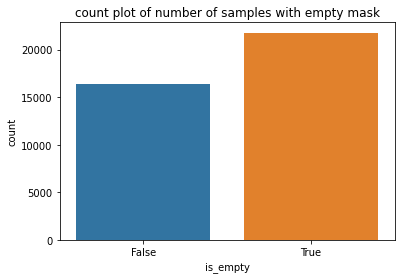

In [ ]:
sns.countplot(x ='is_empty', data = data_df)
plt.title('count plot of number of samples with empty mask')

In [ ]:
def get_images(paths):
    images = []
    for img_path in tqdm.tqdm(paths):
        sample_img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
        images.append(sample_img)
        
    return images
        
loaded_images = get_images(data_df.path)

100%|██████████| 38208/38208 [01:08<00:00, 557.31it/s]


In [ ]:
len(loaded_images)

38208

In [ ]:
transform = transforms.Compose([
  transforms.RandomHorizontalFlip(),
  transforms.RandomRotation((0, 360)),
])

In [ ]:
class ImageDataset(Dataset):
    def __init__(self, images, images_df, transform=None, tp=0.4):
        self.images = images
        self.images_df = images_df
        self.transform = transform
        self.tp = tp
        
        
    def __len__(self):
        return len(self.images_df)
    
       
    def __getitem__(self, idx:int):
        image = self.images[idx]
        image = np.max(image) - image
        image = image - image.min()
        image = image / image.max()
        image = np.expand_dims(image, axis=0)
        
        lb_seg_mask = self.rle2mask(image.shape[1:], self.images_df.large_bowel[idx])
        sb_seg_mask = self.rle2mask(image.shape[1:], self.images_df.small_bowel[idx])
        stomach_seg_mask = self.rle2mask(image.shape[1:], self.images_df.stomach[idx])
        
        gt_mask = np.stack((lb_seg_mask, sb_seg_mask, stomach_seg_mask), axis=0)

        image = self.resize(image.astype('float32')) #shape: (1, H, W)
        gt_mask = self.resize(gt_mask.astype('float32')) #shape: (3, H, W)

        if self.transform:
            randn = np.random.rand()
            if randn < self.tp:
                aug = self.transform(
                    torch.from_numpy(
                        np.concatenate((image, gt_mask), axis=0)
                    ))
                image, gt_mask = aug[0].unsqueeze(dim=0), aug[1:]

        return image, gt_mask
    
    
    def rle2mask(self, img_shape, rle:str):
        #correct order: (H, W)
        H, W = img_shape
        if pd.isnull(rle): return np.zeros((H, W), dtype=np.int8)
        
        rle = rle.split()
        start_idx, lengths = np.array(rle[0::2], dtype=int), np.array(rle[1::2], dtype=int)
        end_idx = start_idx + (lengths - 1)

        mask = np.zeros(H*W, dtype=np.int8)
        for start, end in zip(start_idx, end_idx):
            mask[start:end] = 1

        mask = mask.reshape(H, W)
        return mask
    
    
    def resize(self, image, size=(224, 224)):
        #image shape: C, H, W or N, C, H, W
        H, W = size
        assert len(image.shape) == 3 or len(image.shape) == 4, 'input image must be of shape  C, H, W or N, C, H, W'

        if isinstance(image, np.ndarray): image = torch.from_numpy(image) 
        res_model = transforms.Resize((H, W), interpolation=transforms.InterpolationMode.NEAREST)
        image = res_model(image)
        return image

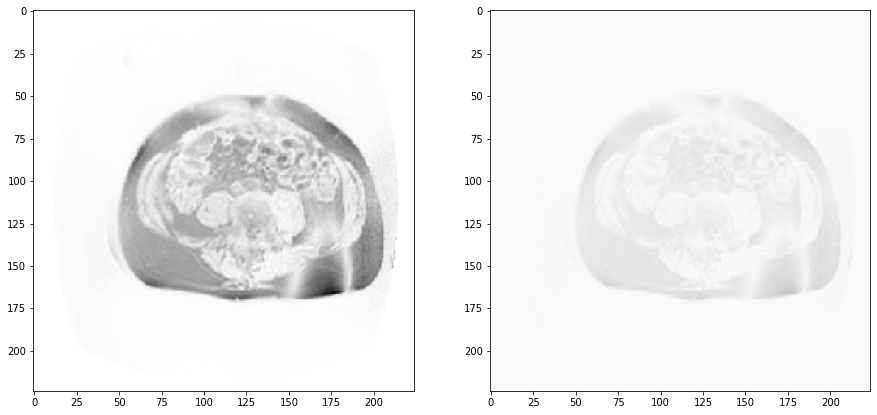

In [ ]:
data = ImageDataset(loaded_images, data_df, transform)

image, gt_mask = data[0]

fig, axs = plt.subplots(1, 2, figsize=(15, 7))

alpha = 0.4

axs[0].imshow(image.squeeze(), cmap='gray')

axs[1].imshow(image.squeeze(), cmap='gray')
axs[1].imshow(gt_mask[0], cmap='Reds', alpha=alpha)
axs[1].imshow(gt_mask[1], cmap='Blues', alpha=alpha)
axs[1].imshow(gt_mask[2], cmap='Greens', alpha=alpha)

In [ ]:
torch.manual_seed(3407)
torch.cuda.manual_seed(3407)
np.random.seed(3407)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [ ]:
class SpatialEncoder(ResNet):
    def __init__(self, input_channels, dropout=0.2, pretrained=False):
        super(SpatialEncoder, self).__init__(BasicBlock, [3, 4, 6, 3])
        
        self.input_channels = input_channels
        self.dropout = dropout
        self.pretrained = pretrained
        
        #init resnet18 weights
        if self.input_channels == 3:
            self.load_state_dict(
                torchvision.models.resnet18(
                    pretrained=self.pretrained
                ).state_dict()
            )
        
        self.conv1 = nn.Conv2d(
            self.input_channels, 64, 
            kernel_size=(7, 7), 
            stride=(2, 2), 
            padding=(3, 3), 
            bias=False)
        
        self.conv2 = nn.Conv2d(
            64, 64, 
            kernel_size=(7, 7), 
            stride=(2, 2), 
            padding=(3, 3),
            bias=False)
        
        self.dropout_layer = nn.Dropout(self.dropout)
        
        
    def forward(self, x):
        fmap1 = self.conv1(x)
        x = self.conv2(fmap1)
        x = self.bn1(x)
        x = self.dropout_layer(self.relu(x))
        fmap2 = self.layer1(x)
        fmap3 = self.layer2(fmap2)
        fmap4 = self.layer3(fmap3)
        fmap5 = self.layer4(fmap4)
        
        return fmap1, fmap2, fmap3, fmap4, fmap5

In [ ]:
class Decoder(nn.Module):
    def __init__(self, last_fmap_channel, output_channel, n_classes, dropout=0.2):
        super(Decoder, self).__init__()
        
        self.last_fmap_channel = last_fmap_channel
        self.output_channel = output_channel
        self.n_classes = n_classes
        self.dropout = dropout
        
        fmap1_ch, fmap2_ch, fmap3_ch, fmap4_ch, fmap5_ch = (
            self.last_fmap_channel//8,
            self.last_fmap_channel//8, 
            self.last_fmap_channel//4, 
            self.last_fmap_channel//2, 
            self.last_fmap_channel
        )
        
        self.layer1 = nn.Sequential(
            nn.ConvTranspose2d(fmap5_ch, fmap5_ch, (2, 2), stride=(2, 2)),
            nn.BatchNorm2d(fmap5_ch),
            nn.Tanh(),
            nn.Dropout(self.dropout)
        )
        
        in_ch = fmap5_ch+fmap4_ch
        self.layer2 = nn.Sequential(
            nn.ConvTranspose2d(in_ch, fmap5_ch, (2, 2), stride=(2, 2)),
            nn.BatchNorm2d(fmap5_ch),
            nn.Tanh(),
            nn.Dropout(self.dropout)
        )
        
        in_ch = fmap5_ch+fmap3_ch
        self.layer3 = nn.Sequential(
            nn.ConvTranspose2d(in_ch, fmap5_ch, (2, 2), stride=(2, 2)),
            nn.BatchNorm2d(fmap5_ch),
            nn.Tanh(),
            nn.Dropout(self.dropout)
        )
        
        in_ch = fmap5_ch+fmap2_ch
        self.layer4 = nn.Sequential(
            nn.ConvTranspose2d(in_ch, fmap5_ch, (2, 2), stride=(2, 2)),
            nn.BatchNorm2d(fmap5_ch),
            nn.Tanh(),
            nn.Dropout(self.dropout)
        )
        
        in_ch = fmap5_ch+fmap1_ch
        self.layer5 = nn.Sequential(
            nn.ConvTranspose2d(in_ch, self.output_channel*self.n_classes, (2, 2), stride=(2, 2)),
            nn.Sigmoid()
        )
        
    def forward(self, fmap1, fmap2, fmap3, fmap4, fmap5):
        output = self.layer1(fmap5)
        output = torch.cat((output, fmap4), dim=1)
        
        output = self.layer2(output)
        output = torch.cat((output, fmap3), dim=1)
        
        output = self.layer3(output)
        output = torch.cat((output, fmap2), dim=1)
        
        output = self.layer4(output)
        output = torch.cat((output, fmap1), dim=1)
        output = self.layer5(output)
        
        return output

In [ ]:
class SegmentNet(nn.Module):
    def __init__(self, input_channels, last_fmap_channel, 
                output_channel, n_classes, 
                pretrained=False, enc_dropout=0.1,
                dec_dropout=0.1):
        
        super(SegmentNet, self).__init__()
    
        self.input_channels = input_channels
        self.last_fmap_channel = last_fmap_channel
        self.output_channel = output_channel
        self.pretrained = pretrained
        self.n_classes = n_classes
        self.enc_dropout = enc_dropout
        self.dec_dropout = dec_dropout
        
        self.encoder = SpatialEncoder(
            self.input_channels, 
            self.enc_dropout)
        
        self.decoder = Decoder(
            self.last_fmap_channel, 
            self.output_channel, 
            self.n_classes, 
            self.dec_dropout
        )
        
    
    def forward(self, x):
        fmap1, fmap2, fmap3, fmap4, fmap5 = self.encoder(x)
        segmentation_mask = self.decoder(fmap1, fmap2, fmap3, fmap4, fmap5)
        return segmentation_mask
    

In [ ]:
class FitterPipeline:
    def __init__(self, model, lossfunc, optimizer, device='cpu'):
        self.device = device
        self.model = model.to(self.device)
        self.lossfunc = lossfunc
        self.optimizer = optimizer
        
        self.model.apply(self.init_weights)
        
    
    def init_weights(self, m):
        if isinstance(m, nn.Conv2d):
            nn.init.xavier_uniform_(m.weight)
            if torch.is_tensor(m.bias):
                m.bias.data.fill_(0.01)
    
    
    def save_model(self, dirname='./model_params', 
                   filename='tumor_segmentation_params.pth.tar'):
        if not os.path.isdir(dirname):os.mkdir(dirname)
        state_dicts = {
            'segmentation_net_params':self.model.state_dict(),
            'optimizer_params':self.optimizer.state_dict(),
        }
        return torch.save(state_dicts, os.path.join(dirname, filename))
        

    def train(self, dataloader, epochs=1, verbose=False):
        self.model.train()
        
        losses, hds, dice_coeffs = [], [], []
        for epoch in range(epochs):
            loss, hd, dice_coeff = 0, 0, 0
            for idx, (image, gt_mask) in tqdm.tqdm(enumerate(dataloader)):
                
                self.model.zero_grad()
                image, gt_mask = image.to(self.device), gt_mask.to(self.device)
                
                pred_mask = self.model(image)
                
                #batch loss
                batch_loss = self.lossfunc(pred_mask, gt_mask)

                #backward propagation
                batch_loss.backward()
                self.optimizer.step()
                
                #metric values
                batch_hd, batch_dice_coeff, _ = self.lossfunc.metric_values(pred_mask, gt_mask)

                loss += batch_loss.item()
                dice_coeff += batch_dice_coeff
                hd += batch_hd
            
            loss = loss / (idx + 1)
            hd = hd / (idx + 1)
            dice_coeff = dice_coeff / (idx + 1)
            
            if verbose:
                print(f'epoch: {epoch} \nTraining Loss: {loss} \nTrain Dice Coeff: {dice_coeff} \nTrain Hausdorff Distance: {hd}')
            losses.append(loss)
            hds.append(hd)
            dice_coeffs.append(dice_coeff)
        return losses, hds, dice_coeffs
    
    
    def test(self, dataloader, verbose=False):
        self.model.eval()
        
        loss, hd, dice_coeff = 0, 0, 0
        with torch.no_grad():
            for idx, (image, gt_mask) in tqdm.tqdm(enumerate(dataloader)):

                image, gt_mask = image.to(self.device), gt_mask.to(self.device)

                pred_mask = self.model(image)

                #batch loss
                batch_loss = self.lossfunc(pred_mask, gt_mask)
                                
                #metric values
                batch_hd, batch_dice_coeff, _ = self.lossfunc.metric_values(pred_mask, gt_mask)

                loss += batch_loss.item()
                dice_coeff += batch_dice_coeff
                hd += batch_hd
            
        loss = loss / (idx + 1)
        hd = hd / (idx + 1)
        dice_coeff = dice_coeff / (idx + 1)

        if verbose:
            print(f'\n Testing Loss: {loss}  \nTest Dice Coeff: {dice_coeff} \nTest Hausdorff Distance: {hd}')
        return loss, hd, dice_coeff

In [ ]:
def trim_empty_tag(df, p):
    rand_n = np.random.rand()
    df['to_delete'] = False
    if df.is_empty == True:
        if rand_n < p:
            df['to_delete'] = True
    return df

def trim_empty(df, images, p=0.3):
    assert p <= 1, 'p should be within range of 0 and 1'
    trim = lambda df: trim_empty_tag(df, p)
    df = df.apply(trim, axis=1)

    trim_mask = df['to_delete'].values
    images = [i for (i, m) in zip(images, trim_mask) if m != True]
    df = df[df['to_delete'] != True]
    df.index = [i for i in range(len(df))]
    return df, images

In [ ]:
train_size = 0.7
test_size = 0.2
eval_size = 0.1

train_length = int(len(loaded_images) * train_size)
test_length = int(len(loaded_images) * test_size)
eval_length = int(len(loaded_images) * eval_size)

train_images, test_images, eval_images = (
    loaded_images[:train_length],
    loaded_images[train_length:train_length+test_length],
    loaded_images[train_length+test_length:])

train_data_df, test_data_df, eval_data_df = (
    data_df.iloc[:train_length, :], 
    data_df.iloc[train_length:train_length+test_length, :],
    data_df.iloc[train_length+test_length:, :])

test_data_df.index = [i for i in range(len(test_data_df))]
eval_data_df.index = [i for i in range(len(eval_data_df))]

#reduce the number of empty samples for training and testing data

train_data_df, train_images = trim_empty(train_data_df, train_images, p=0.6)
test_data_df, test_images = trim_empty(test_data_df, test_images, p=0.6)
eval_data_df, eval_images = trim_empty(eval_data_df, eval_images)


batch_size = 32

train_data = ImageDataset(train_images, train_data_df, transform=transform, tp=0.2)
train_dataloader = DataLoader(train_data, shuffle=True, batch_size=batch_size, num_workers=4)

test_data = ImageDataset(test_images, test_data_df, transform=None)
test_dataloader = DataLoader(test_data, shuffle=True, batch_size=batch_size, num_workers=4)

eval_data = ImageDataset(eval_images, eval_data_df, transform=None)
eval_dataloader = DataLoader(eval_data, shuffle=True, batch_size=batch_size, num_workers=2)

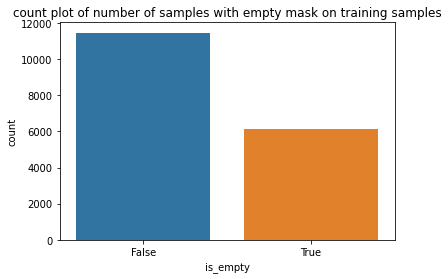

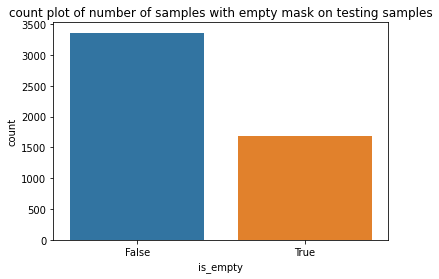

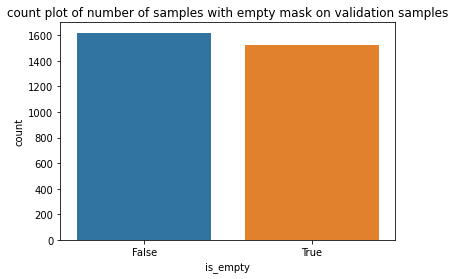

In [ ]:
sns.countplot(x ='is_empty', data = train_data_df)
plt.title('count plot of number of samples with empty mask on training samples')
plt.show()

sns.countplot(x ='is_empty', data = test_data_df)
plt.title('count plot of number of samples with empty mask on testing samples')
plt.show()

sns.countplot(x ='is_empty', data = eval_data_df)
plt.title('count plot of number of samples with empty mask on validation samples')
plt.show()

In [ ]:
del data_df, loaded_images
gc.collect()

6497

In [ ]:
class SegementationMetric(nn.Module):
    def __init__(self, w1=0.6, w2=0.4):
        """
        w1 corresponds to weightage of hausdorff distance
        w2 corresponds to weightage of dice coefficent score
        """

        assert w1 + w2 == 1, 'sum of all weights must be equal to 1'
        super(SegementationMetric, self).__init__()

        self.w1 = w1
        self.w2 = w2
        self.bce_loss = nn.BCELoss()

    
    def hausdorff_distance(self, pred, target, max_dist=224):
        #pred shape: (N, C, H, W)
        #target shape: (N, C, H, W)
        pred = pred.detach().cpu().round()
        target = target.cpu()

        warnings.filterwarnings("ignore")

        #compute the hausdorff distance for each batch
        batch_distances = compute_hausdorff_distance(pred, target, distance_metric='euclidean', include_background=True)

        batch_distances[batch_distances == torch.inf] = max_dist
        batch_distances[batch_distances != batch_distances] = 0

        #get max distance for each batch and compute mean
        batch_distances = batch_distances.max(dim=1)
        dist = batch_distances[0].mean()
        dist = dist / max_dist
        return dist


    def dice_coeff(self, prediction, ground_truth, epsilon=1e-5):
        #input shape: N, C, H, W
        prediction = prediction.cpu().round()
        ground_truth = ground_truth.cpu()
        intersection = torch.sum(torch.abs(ground_truth * prediction), dim=(2, 3))
        denominator = ground_truth.sum(dim=(2, 3)) + prediction.sum(dim=(2, 3))
        dice_coeff = ((2 * intersection + epsilon) / (denominator + epsilon)).mean(dim=(0, 1))
        return dice_coeff.item()

      
    def metric_values(self, prediction, ground_truth):
        #input shape: N, C, H, W
        hausdorff_distance = self.hausdorff_distance(prediction, ground_truth)
        dice_coeff = self.dice_coeff(prediction, ground_truth)
        bce_loss = self.bce_loss(prediction, ground_truth)
        return hausdorff_distance, dice_coeff, bce_loss

    
    def forward(self, prediction, ground_truth):
        #input shape: N, C, H, W
        hausdorff_distance, dice_coeff, bce_loss = self.metric_values(prediction, ground_truth)
        hausdorff_distance = torch.tensor(hausdorff_distance)

        acc_score = (self.w1 * (1 - hausdorff_distance)) + (self.w2 * dice_coeff)
        loss = (1 + bce_loss) * (1 - acc_score).requires_grad_(True)
        return loss
    

In [ ]:
input_channels = 1 
last_fmap_channel = 512
output_channel = 1 
n_classes=3
enc_dropout=0.0
dec_dropout=0.0

model = SegmentNet(
    input_channels, 
    last_fmap_channel, 
    output_channel, 
    n_classes, 
    enc_dropout=enc_dropout,
    dec_dropout=dec_dropout)


learning_rate = 1e-3
weight_decay = 0.0
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

lossfunc = SegementationMetric()

In [ ]:
model

SegmentNet(
  (encoder): SpatialEncoder(
    (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

pipeline = FitterPipeline(model, lossfunc, optimizer, device)

lr_scheduler = torch.optim.lr_scheduler.StepLR(
    pipeline.optimizer, step_size=15, gamma=0.1, verbose=True)

Adjusting learning rate of group 0 to 1.0000e-03.


In [37]:
print(f'Model is training on {torch.cuda.get_device_name()} \n\n')

EPOCHS = 50

training_losses, training_hds, training_dice_coeffs = [], [], []
testing_losses, testing_hds, testing_dice_coeffs = [], [], []

w1, w2 = 0.6, 0.4

best_loss = np.inf
for i in range(EPOCHS):
    print(f'\n\nepoch: {i}')
    train_loss, training_hd, train_dice_coeff = pipeline.train(train_dataloader)
    training_losses.append(train_loss[0])
    training_hds.append(training_hd[0])
    training_dice_coeffs.append(train_dice_coeff[0])
    print(
        f'\ntraining loss: {train_loss[0]}',
        f'\ntraining hausdorff dist: {training_hd[0]}',
        f'\ntraining dice coeff: {train_dice_coeff[0]}', 
        f'\ntrain score: {(w1 * (1 - training_hd[0])) + (w2 * train_dice_coeff[0])}')
    
    test_loss, testing_hd, test_dice_coeff = pipeline.test(test_dataloader)
    testing_losses.append(test_loss)
    testing_hds.append(testing_hd)
    testing_dice_coeffs.append(test_dice_coeff)
    print(f'testing loss: {test_loss}', 
          f'\ntesting hausdorff dist: {testing_hd}', 
          f'\ntesting dice coeff: {test_dice_coeff}',
          f'\ntest score: {(w1 * (1 - testing_hd)) + (w2 * test_dice_coeff)}')
    
    lr_scheduler.step()
    if test_loss < best_loss:
        best_loss = test_loss
        pipeline.save_model()
        print(f'model saved at epoch {i}')

Model is training on Tesla P100-PCIE-16GB 




epoch: 0


549it [08:05,  1.13it/s]


training loss: 0.5953776308060041 
training hausdorff dist: 0.6244318844798622 
training dice coeff: 0.5141637129931051 
train score: 0.43100635450932473



158it [01:28,  1.79it/s]


testing loss: 0.5174645947226604 
testing hausdorff dist: 0.5394792221690736 
testing dice coeff: 0.5586372879864294 
test score: 0.4997673818931276
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 0


epoch: 1


549it [08:04,  1.13it/s]



training loss: 0.42323308841425833 
training hausdorff dist: 0.4374851913481089 
training dice coeff: 0.6205392075475231 
train score: 0.585724568210144


158it [01:27,  1.80it/s]


testing loss: 0.48532901146803215 
testing hausdorff dist: 0.5117461188069397 
testing dice coeff: 0.5869233866658392 
test score: 0.5277216833821718
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 1


epoch: 2


549it [08:12,  1.12it/s]



training loss: 0.3472781465526524 
training hausdorff dist: 0.35604605948949614 
training dice coeff: 0.6810755388767125 
train score: 0.6588025798569873


158it [01:30,  1.74it/s]


testing loss: 0.3901978344714553 
testing hausdorff dist: 0.4160065229157142 
testing dice coeff: 0.6659522284812565 
test score: 0.616776977643074
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 2


epoch: 3


549it [08:11,  1.12it/s]



training loss: 0.30477954389179945 
training hausdorff dist: 0.3139735601292525 
training dice coeff: 0.7205199074875461 
train score: 0.6998238269174669


158it [01:30,  1.75it/s]

testing loss: 0.5440858492508721 
testing hausdorff dist: 0.5943290565822908 
testing dice coeff: 0.577238289615776 
test score: 0.4742978818969359
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 4



549it [08:07,  1.13it/s]


training loss: 0.26603184744896163 
training hausdorff dist: 0.2728072224815563 
training dice coeff: 0.7529310483098681 
train score: 0.7374880858350135



158it [01:28,  1.78it/s]


testing loss: 0.28805479034862397 
testing hausdorff dist: 0.3001164900765267 
testing dice coeff: 0.7414792112157315 
test score: 0.7165217904403764
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 4


epoch: 5


549it [08:08,  1.12it/s]


training loss: 0.2396749229010843 
training hausdorff dist: 0.24596503415916998 
training dice coeff: 0.7768941138394326 
train score: 0.763178625040271



158it [01:30,  1.74it/s]


testing loss: 0.22964848448472955 
testing hausdorff dist: 0.24052782919560328 
testing dice coeff: 0.7930954924867123 
test score: 0.772921499477323
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 5


epoch: 6


549it [08:09,  1.12it/s]



training loss: 0.21474628047684108 
training hausdorff dist: 0.22043966312929864 
training dice coeff: 0.799525066151645 
train score: 0.7875462285830788


158it [01:30,  1.75it/s]


testing loss: 0.23900546356455063 
testing hausdorff dist: 0.24361127538020638 
testing dice coeff: 0.7753555948221231 
test score: 0.7639754727007253
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 7


549it [08:09,  1.12it/s]



training loss: 0.19807265173145447 
training hausdorff dist: 0.2037323954785861 
training dice coeff: 0.8153250810227107 
train score: 0.8038905951219326


158it [01:28,  1.78it/s]


testing loss: 0.34210580178983985 
testing hausdorff dist: 0.3662742653672385 
testing dice coeff: 0.7109272529052783 
test score: 0.6646063419417683
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 8


549it [08:08,  1.12it/s]



training loss: 0.18397162700036393 
training hausdorff dist: 0.18870251707167318 
training dice coeff: 0.8273773149931583 
train score: 0.8177294157542594


158it [01:30,  1.74it/s]


testing loss: 0.15203372706255258 
testing hausdorff dist: 0.157801420564136 
testing dice coeff: 0.8596569986283025 
test score: 0.8491819471128393
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 8


epoch: 9


549it [08:09,  1.12it/s]



training loss: 0.17724663982892283 
training hausdorff dist: 0.1825955424182418 
training dice coeff: 0.8347422892061522 
train score: 0.8243395902315158


158it [01:29,  1.76it/s]


testing loss: 0.194450531842619 
testing hausdorff dist: 0.20148495430462754 
testing dice coeff: 0.8207400188415865 
test score: 0.8074050349538581
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 10


549it [08:09,  1.12it/s]



training loss: 0.16188437298689842 
training hausdorff dist: 0.16578590693135814 
training dice coeff: 0.8472965444372 
train score: 0.8394470736160651


158it [01:30,  1.75it/s]


testing loss: 0.1813235437569048 
testing hausdorff dist: 0.1932388183412579 
testing dice coeff: 0.8405222994617269 
test score: 0.8202656287799359
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 11


549it [08:09,  1.12it/s]



training loss: 0.15768230857667473 
training hausdorff dist: 0.16291353099804973 
training dice coeff: 0.8532871995901584 
train score: 0.8435667612372335


158it [01:30,  1.74it/s]


testing loss: 0.21571551029065875 
testing hausdorff dist: 0.22483386271585734 
testing dice coeff: 0.8046364938911004 
test score: 0.7869542799269258
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 12


549it [08:09,  1.12it/s]



training loss: 0.15268763258558965 
training hausdorff dist: 0.15774187328588504 
training dice coeff: 0.8578495698114128 
train score: 0.8484947039530342


158it [01:29,  1.77it/s]


testing loss: 0.24691068197769617 
testing hausdorff dist: 0.25770929079010496 
testing dice coeff: 0.7796125049832501 
test score: 0.7572194275192371
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 13


549it [08:07,  1.13it/s]



training loss: 0.14611783748742874 
training hausdorff dist: 0.15024854529224402 
training dice coeff: 0.8628307219411506 
train score: 0.8549831616011139


158it [01:30,  1.75it/s]


testing loss: 0.1529908838804371 
testing hausdorff dist: 0.16537973450226123 
testing dice coeff: 0.8683013176616234 
test score: 0.8480926863632927
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 14


549it [08:06,  1.13it/s]



training loss: 0.1389246114355639 
training hausdorff dist: 0.1432035466997201 
training dice coeff: 0.8699793912239631 
train score: 0.8620696284697531


158it [01:27,  1.81it/s]


testing loss: 0.115270025137233 
testing hausdorff dist: 0.11825014850570345 
testing dice coeff: 0.8909949041620085 
test score: 0.8854478725613814
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 14


epoch: 15


549it [07:59,  1.15it/s]



training loss: 0.10560886938855234 
training hausdorff dist: 0.10489868532414666 
training dice coeff: 0.8949214081078062 
train score: 0.8950293520486345


158it [01:27,  1.80it/s]


testing loss: 0.09450352039483821 
testing hausdorff dist: 0.09551816935792536 
testing dice coeff: 0.9082771724537958 
test score: 0.9059999673667631
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 15


epoch: 16


549it [07:58,  1.15it/s]



training loss: 0.09743235822460167 
training hausdorff dist: 0.09559326288396448 
training dice coeff: 0.901210864819247 
train score: 0.90312838819732


158it [01:27,  1.81it/s]


testing loss: 0.09114919107965451 
testing hausdorff dist: 0.09171876686792647 
testing dice coeff: 0.910894954506355 
test score: 0.9093267216817862
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 16


epoch: 17


549it [07:54,  1.16it/s]



training loss: 0.09668173988315973 
training hausdorff dist: 0.094866998358673 
training dice coeff: 0.9019764821386077 
train score: 0.9038703938402394


158it [01:26,  1.83it/s]


testing loss: 0.08975809336762952 
testing hausdorff dist: 0.09039892000783718 
testing dice coeff: 0.9123768953582908 
test score: 0.910711406138614
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 17


epoch: 18


549it [07:56,  1.15it/s]


training loss: 0.09237688371837095 
training hausdorff dist: 0.08999160078842934 
training dice coeff: 0.9053320766363856 
train score: 0.9081378701814966



158it [01:27,  1.81it/s]


testing loss: 0.08743022528099538 
testing hausdorff dist: 0.08692698489611242 
testing dice coeff: 0.9129624962806702 
test score: 0.9130288075746007
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 18


epoch: 19


549it [07:57,  1.15it/s]



training loss: 0.09185657451080449 
training hausdorff dist: 0.08982389045092565 
training dice coeff: 0.906362928110828 
train score: 0.9086508369737758


158it [01:26,  1.82it/s]


testing loss: 0.08907942934343133 
testing hausdorff dist: 0.08967929164923846 
testing dice coeff: 0.9129506062857712 
test score: 0.9113726675247653
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 20


549it [07:58,  1.15it/s]



training loss: 0.0905564562688312 
training hausdorff dist: 0.08807598527518645 
training dice coeff: 0.9069632872640544 
train score: 0.9099397237405098


158it [01:28,  1.78it/s]


testing loss: 0.08824481314063512 
testing hausdorff dist: 0.08795479848498983 
testing dice coeff: 0.9124358998069281 
test score: 0.9122014808317774
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 21


549it [08:06,  1.13it/s]



training loss: 0.08840850828163672 
training hausdorff dist: 0.08601723791116023 
training dice coeff: 0.9091785855197733 
train score: 0.9120610914612131


158it [01:29,  1.76it/s]


testing loss: 0.09402703816757355 
testing hausdorff dist: 0.0965367103206804 
testing dice coeff: 0.9109242290635652 
test score: 0.9064476654330178
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 22


549it [08:06,  1.13it/s]



training loss: 0.08816377979759919 
training hausdorff dist: 0.08600282973316405 
training dice coeff: 0.909752649144831 
train score: 0.912299361818034


158it [01:30,  1.75it/s]


testing loss: 0.08442699445990626 
testing hausdorff dist: 0.0842069114567392 
testing dice coeff: 0.9163054261780992 
test score: 0.9159980235971962
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 22


epoch: 23


549it [08:07,  1.13it/s]



training loss: 0.08471124022722563 
training hausdorff dist: 0.0822702551838107 
training dice coeff: 0.9127209983453942 
train score: 0.9157262462278712


158it [01:29,  1.76it/s]


testing loss: 0.0828520146654571 
testing hausdorff dist: 0.0823368204115753 
testing dice coeff: 0.9174260561224781 
test score: 0.9175683302020461
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 23


epoch: 24


549it [08:06,  1.13it/s]



training loss: 0.0855308366968675 
training hausdorff dist: 0.08352358438172511 
training dice coeff: 0.9125548119102019 
train score: 0.9149077741350456


158it [01:30,  1.75it/s]


testing loss: 0.09059852557706553 
testing hausdorff dist: 0.09309097931471072 
testing dice coeff: 0.9142794537393353 
test score: 0.9098571939069077
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 25


549it [08:07,  1.13it/s]



training loss: 0.08437053205398645 
training hausdorff dist: 0.08268286492722801 
training dice coeff: 0.9141646909149184 
train score: 0.9160561574096305


158it [01:30,  1.75it/s]


testing loss: 0.0852688362461109 
testing hausdorff dist: 0.08676479261835561 
testing dice coeff: 0.9180136681357517 
test score: 0.9151465916832874
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 26


549it [08:07,  1.13it/s]



training loss: 0.07962484673860856 
training hausdorff dist: 0.07718757257967415 
training dice coeff: 0.9177070405531016 
train score: 0.9207702726734361


158it [01:29,  1.76it/s]


testing loss: 0.08203387309222544 
testing hausdorff dist: 0.08222475457366567 
testing dice coeff: 0.9192548077317733 
test score: 0.91836707034851
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 26


epoch: 27


549it [08:06,  1.13it/s]



training loss: 0.08099126665623908 
training hausdorff dist: 0.07943723144834881 
training dice coeff: 0.9176703422230232 
train score: 0.9194057980202


158it [01:30,  1.75it/s]


testing loss: 0.08194097449805995 
testing hausdorff dist: 0.08233362440432734 
testing dice coeff: 0.9196397896054425 
test score: 0.9184557411995806
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 27


epoch: 28


549it [08:07,  1.13it/s]



training loss: 0.07704266238268055 
training hausdorff dist: 0.07420502340933534 
training dice coeff: 0.9196331775687866 
train score: 0.9233302569819134


158it [01:29,  1.76it/s]


testing loss: 0.08530743320583936 
testing hausdorff dist: 0.08618005687883039 
testing dice coeff: 0.917054105408584 
test score: 0.9151136080361354
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 29


549it [08:08,  1.12it/s]



training loss: 0.07922415245218548 
training hausdorff dist: 0.0776310047647662 
training dice coeff: 0.9193305425305184 
train score: 0.9211536141533476


158it [01:30,  1.75it/s]


testing loss: 0.08471383418399396 
testing hausdorff dist: 0.08532876927585208 
testing dice coeff: 0.9172733852380439 
test score: 0.9157120925297062
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 30


549it [08:08,  1.12it/s]


training loss: 0.07720837722485113 
training hausdorff dist: 0.07497999462711537 
training dice coeff: 0.9203654842515678 
train score: 0.923158196924358



158it [01:30,  1.75it/s]


testing loss: 0.07913271659573523 
testing hausdorff dist: 0.07907891519796158 
testing dice coeff: 0.9217616772349877 
test score: 0.921257321775218
Adjusting learning rate of group 0 to 1.0000e-05.
model saved at epoch 30


epoch: 31


549it [08:06,  1.13it/s]


training loss: 0.07265186648427761 
training hausdorff dist: 0.06992812345524575 
training dice coeff: 0.9241045909935443 
train score: 0.9276849623242702



158it [01:30,  1.75it/s]


testing loss: 0.0777944793030709 
testing hausdorff dist: 0.07716592426206514 
testing dice coeff: 0.9222039316273942 
test score: 0.9225820180937185
Adjusting learning rate of group 0 to 1.0000e-05.
model saved at epoch 31


epoch: 32


549it [08:07,  1.13it/s]



training loss: 0.07213293490741449 
training hausdorff dist: 0.06921940567197649 
training dice coeff: 0.9243250150498146 
train score: 0.9281983626167398


158it [01:30,  1.75it/s]


testing loss: 0.0771401601565236 
testing hausdorff dist: 0.07631638148044817 
testing dice coeff: 0.9225566043883939 
test score: 0.9232328128670887
Adjusting learning rate of group 0 to 1.0000e-05.
model saved at epoch 32


epoch: 33


549it [08:07,  1.13it/s]



training loss: 0.0737425662646262 
training hausdorff dist: 0.07118959926479175 
training dice coeff: 0.923280139547011 
train score: 0.9265982962599294


158it [01:30,  1.75it/s]


testing loss: 0.07754551234109278 
testing hausdorff dist: 0.07680744132136162 
testing dice coeff: 0.9222770661492891 
test score: 0.9228263616668986
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 34


549it [08:09,  1.12it/s]


training loss: 0.07125589569627608 
training hausdorff dist: 0.06811874803073582 
training dice coeff: 0.9248530185070628 
train score: 0.9290699585843836



158it [01:30,  1.74it/s]


testing loss: 0.0775899542182728 
testing hausdorff dist: 0.0771536261552094 
testing dice coeff: 0.9226763848262497 
test score: 0.9227783782373743
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 35


549it [08:08,  1.12it/s]



training loss: 0.06943183597805734 
training hausdorff dist: 0.06599183137816336 
training dice coeff: 0.9261926922858955 
train score: 0.9308819780874602


158it [01:30,  1.76it/s]


testing loss: 0.07650747610487971 
testing hausdorff dist: 0.07551276795222127 
testing dice coeff: 0.9229289519635937 
test score: 0.9238639200141048
Adjusting learning rate of group 0 to 1.0000e-05.
model saved at epoch 35


epoch: 36


549it [08:06,  1.13it/s]



training loss: 0.07051331681119949 
training hausdorff dist: 0.0674835684806663 
training dice coeff: 0.9257362261278816 
train score: 0.9298043493627529


158it [01:30,  1.75it/s]


testing loss: 0.07657729780322459 
testing hausdorff dist: 0.07544222114702619 
testing dice coeff: 0.9226349422448799 
test score: 0.9237886442097363
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 37


549it [08:08,  1.12it/s]



training loss: 0.07031995783451862 
training hausdorff dist: 0.06718886502612123 
training dice coeff: 0.9257921587356887 
train score: 0.9300035444786028


158it [01:30,  1.75it/s]


testing loss: 0.0779790025364447 
testing hausdorff dist: 0.07762597265173198 
testing dice coeff: 0.9224276172963879 
test score: 0.922395463327516
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 38


549it [08:07,  1.13it/s]


training loss: 0.07210154236495428 
training hausdorff dist: 0.06946452323777816 
training dice coeff: 0.924766149677214 
train score: 0.9282277459282188



158it [01:30,  1.76it/s]


testing loss: 0.0779706408282433 
testing hausdorff dist: 0.07769417679846716 
testing dice coeff: 0.9225526312484017 
test score: 0.9224045464202804
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 39


549it [08:07,  1.13it/s]



training loss: 0.06958555125462877 
training hausdorff dist: 0.06665121783676849 
training dice coeff: 0.9267901398227949 
train score: 0.9307253252270569


158it [01:29,  1.76it/s]


testing loss: 0.07749337223191863 
testing hausdorff dist: 0.07714107731936347 
testing dice coeff: 0.9229187927668607 
test score: 0.9228828707151262
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 40


549it [08:06,  1.13it/s]



training loss: 0.0706976265587052 
training hausdorff dist: 0.06797616536519031 
training dice coeff: 0.9260124446915798 
train score: 0.9296192786575177


158it [01:30,  1.76it/s]


testing loss: 0.0757112789623126 
testing hausdorff dist: 0.07454321942418846 
testing dice coeff: 0.9234394838538351 
test score: 0.924649861887021
Adjusting learning rate of group 0 to 1.0000e-05.
model saved at epoch 40


epoch: 41


549it [08:06,  1.13it/s]



training loss: 0.07004918757790697 
training hausdorff dist: 0.06732752314129122 
training dice coeff: 0.9266432464014203 
train score: 0.9302607846757933


158it [01:30,  1.75it/s]


testing loss: 0.0773354150808542 
testing hausdorff dist: 0.07684552302428459 
testing dice coeff: 0.9228587278836891 
test score: 0.9230361773389049
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 42


549it [08:07,  1.13it/s]



training loss: 0.07014185967538396 
training hausdorff dist: 0.06719175609070885 
training dice coeff: 0.9262199876304098 
train score: 0.9301729413977387


158it [01:29,  1.76it/s]


testing loss: 0.07612478312758478 
testing hausdorff dist: 0.0752079375974011 
testing dice coeff: 0.9234134875520875 
test score: 0.9242406324623944
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 43


549it [08:07,  1.13it/s]



training loss: 0.0690808957562442 
training hausdorff dist: 0.06584614105870723 
training dice coeff: 0.9268412786537615 
train score: 0.9312288268262803


158it [01:29,  1.76it/s]


testing loss: 0.07665677997702412 
testing hausdorff dist: 0.07616671458257022 
testing dice coeff: 0.9235167307189748 
test score: 0.9237066635380478
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 44


549it [08:07,  1.13it/s]



training loss: 0.07176011343111785 
training hausdorff dist: 0.06967837911833284 
training dice coeff: 0.9259267024872299 
train score: 0.9285636535238921


158it [01:30,  1.75it/s]


testing loss: 0.0761522868236441 
testing hausdorff dist: 0.07530161035795872 
testing dice coeff: 0.923491122979152 
test score: 0.9242154829768856
Adjusting learning rate of group 0 to 1.0000e-06.


epoch: 45


549it [08:08,  1.12it/s]



training loss: 0.07071867738141364 
training hausdorff dist: 0.06846718652374642 
training dice coeff: 0.9266934062613815 
train score: 0.9295970505903047


158it [01:29,  1.76it/s]


testing loss: 0.07698854317211831 
testing hausdorff dist: 0.07657614136080444 
testing dice coeff: 0.9233239568486998 
test score: 0.9233838979229974
Adjusting learning rate of group 0 to 1.0000e-06.


epoch: 46


549it [08:07,  1.13it/s]



training loss: 0.07073715875951495 
training hausdorff dist: 0.06792524763622504 
training dice coeff: 0.925832887164882 
train score: 0.9295780062842178


158it [01:30,  1.75it/s]


testing loss: 0.07674920270216157 
testing hausdorff dist: 0.07620062672723196 
testing dice coeff: 0.923351999702333 
test score: 0.923620423844594
Adjusting learning rate of group 0 to 1.0000e-06.


epoch: 47


549it [08:08,  1.12it/s]



training loss: 0.07147981613992338 
training hausdorff dist: 0.06895275933586299 
training dice coeff: 0.9255344410628786 
train score: 0.9288421208236337


158it [01:30,  1.75it/s]


testing loss: 0.07690420876744175 
testing hausdorff dist: 0.07650164545096302 
testing dice coeff: 0.9234008242057848 
test score: 0.9234593424117361
Adjusting learning rate of group 0 to 1.0000e-06.


epoch: 48


549it [08:07,  1.13it/s]



training loss: 0.07035717026051806 
training hausdorff dist: 0.06760389813588033 
training dice coeff: 0.9263075050543349 
train score: 0.9299606631402058


158it [01:30,  1.75it/s]


testing loss: 0.07724307109620641 
testing hausdorff dist: 0.07695972994607628 
testing dice coeff: 0.9232514643970924 
test score: 0.9231247477911911
Adjusting learning rate of group 0 to 1.0000e-06.


epoch: 49


549it [08:08,  1.12it/s]


training loss: 0.0711155474066618 
training hausdorff dist: 0.06887523060260821 
training dice coeff: 0.9263167612539615 
train score: 0.9292015661400197



158it [01:30,  1.74it/s]


testing loss: 0.07705597318032163 
testing hausdorff dist: 0.07663038285171349 
testing dice coeff: 0.9232226696949971 
test score: 0.9233108381669707
Adjusting learning rate of group 0 to 1.0000e-06.


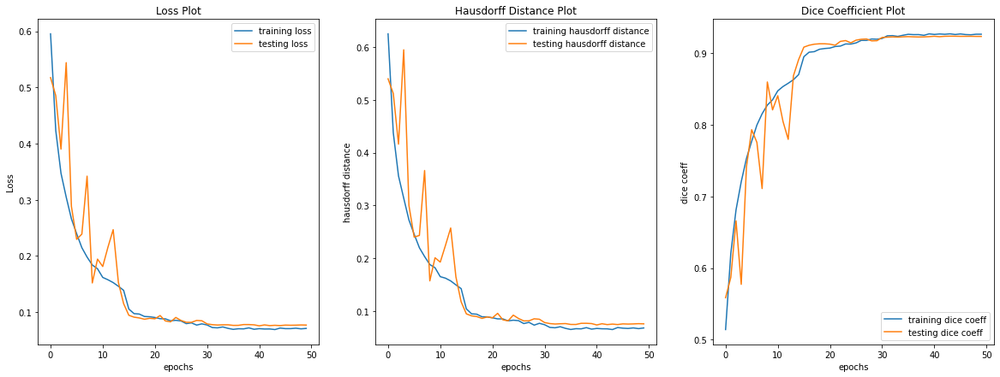

In [38]:
fig, axs = plt.subplots(1, 3, figsize=(20, 7))

axs[0].plot(training_losses, label='training loss')
axs[0].plot(testing_losses, label='testing loss')
axs[0].set_xlabel('epochs')
axs[0].set_ylabel('Loss')
axs[0].set_title('Loss Plot')
axs[0].legend()

axs[1].plot(training_hds, label='training hausdorff distance')
axs[1].plot(testing_hds, label='testing hausdorff distance')
axs[1].set_xlabel('epochs')
axs[1].set_ylabel('hausdorff distance')
axs[1].set_title('Hausdorff Distance Plot')
axs[1].legend()

axs[2].plot(training_dice_coeffs, label='training dice coeff')
axs[2].plot(testing_dice_coeffs, label='testing dice coeff')
axs[2].set_xlabel('epochs')
axs[2].set_ylabel('dice coeff')
axs[2].set_title('Dice Coefficient Plot')
axs[2].legend()

In [39]:
best_model_path = './model_params/tumor_segmentation_params.pth.tar' 
best_model_state = torch.load(best_model_path)['segmentation_net_params']

pipeline.model.load_state_dict(best_model_state)

eval_loss, eval_hd, eval_dice_coeff = pipeline.test(eval_dataloader, verbose=True)

99it [00:53,  1.83it/s]


 Testing Loss: 0.05823506711158029  
Test Dice Coeff: 0.9404240304773505 
Test Hausdorff Distance: 0.05695398826467916


 final mean score is: 0.9127268959358529


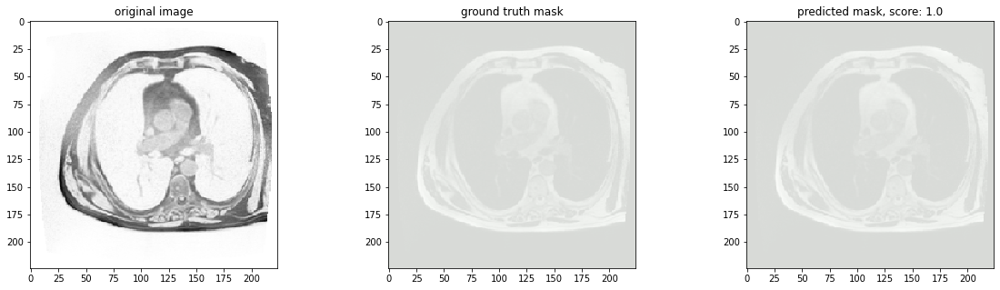

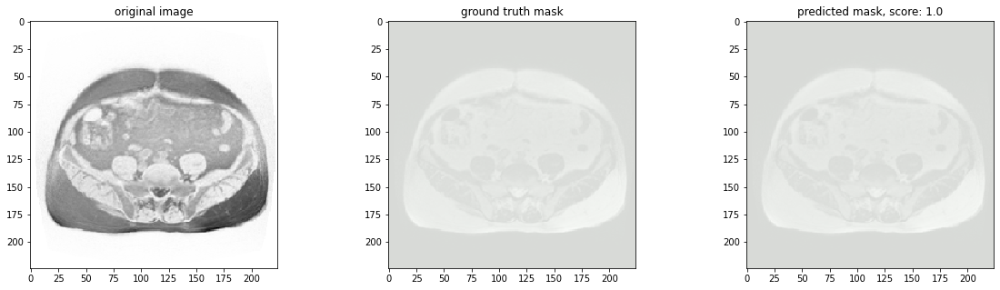

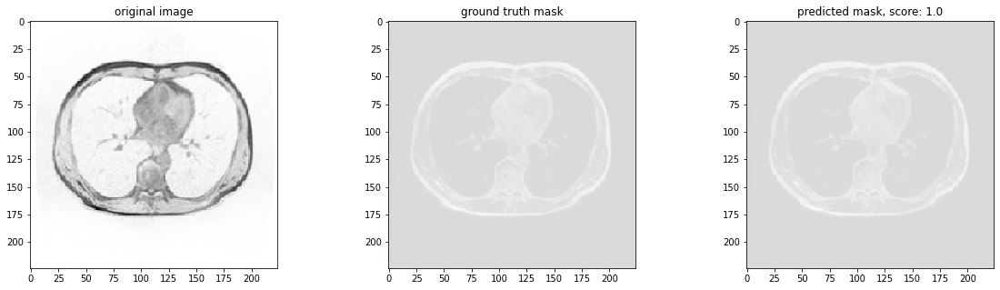

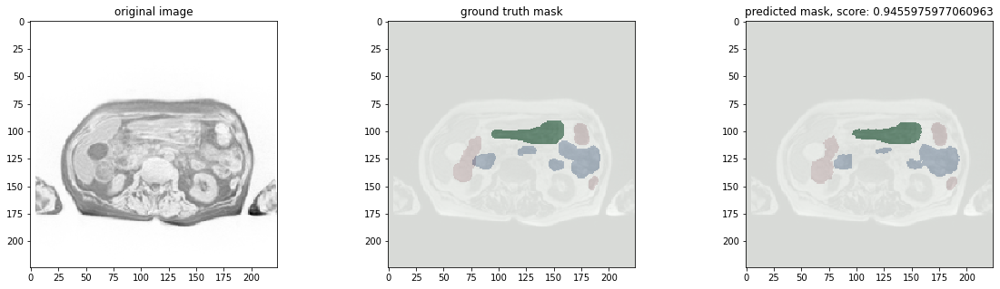

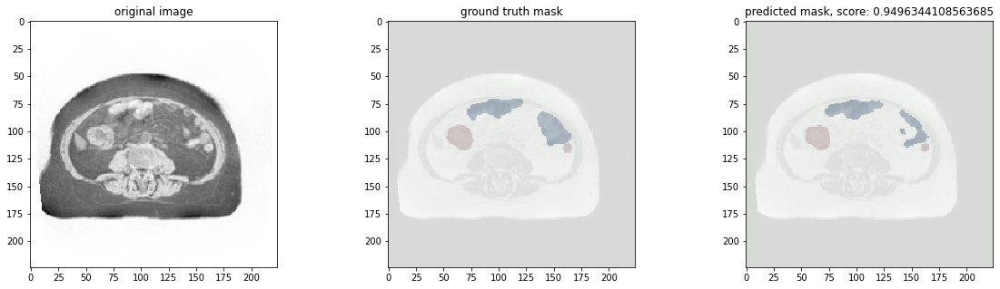

...

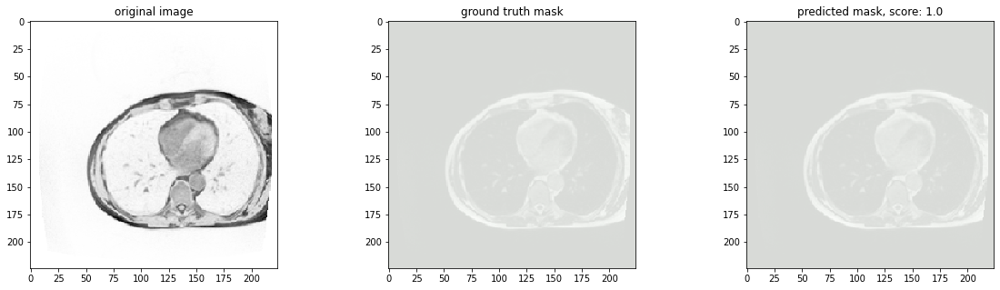

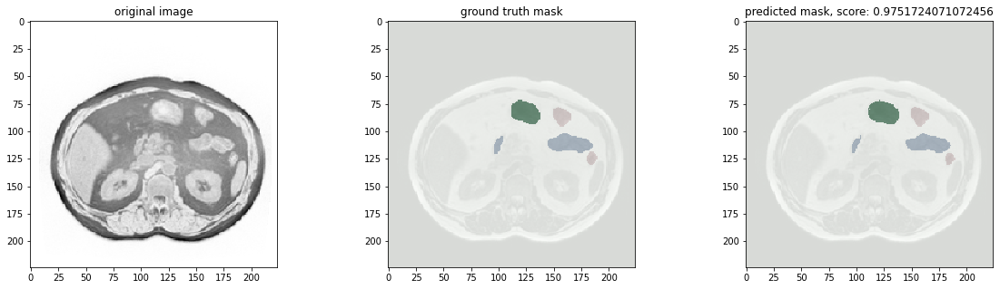

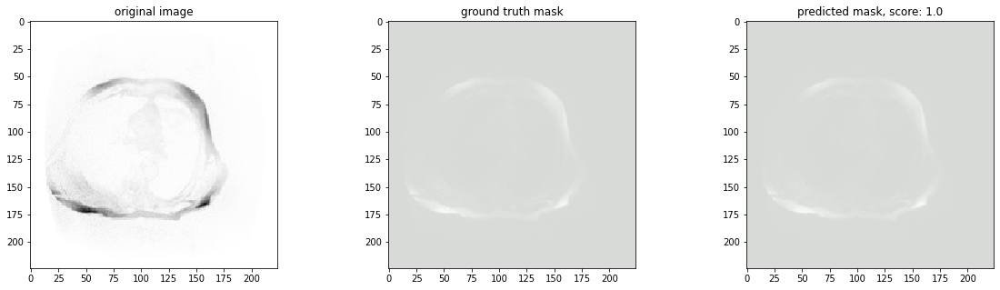

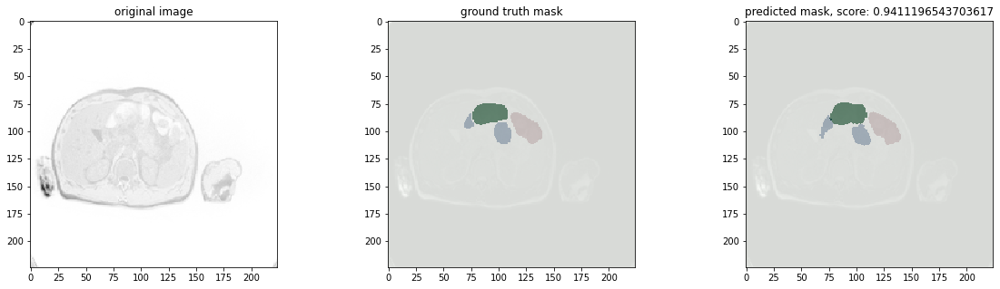

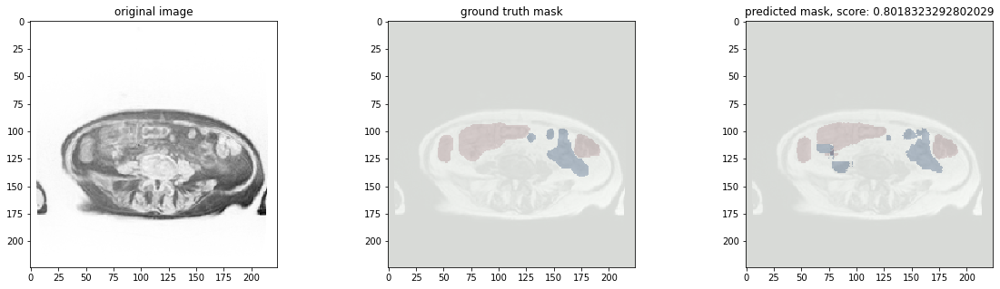

In [40]:
rand_idx = np.random.randint(0, len(eval_data)-1, 100)

scores = []

for i in rand_idx:
    h, w = eval_data_df.height[i], eval_data_df.width[i]

    image, gt_mask = eval_data[i]
    gt_mask = gt_mask.unsqueeze(dim=0)

    eval_sample = image.unsqueeze(dim=0).to(device)
    pred_mask = pipeline.model(eval_sample)

    #print(pred_mask.shape, gt_mask.shape)
    dice_score = pipeline.lossfunc.dice_coeff(pred_mask, gt_mask)

    hd = pipeline.lossfunc.hausdorff_distance(pred_mask, gt_mask, max_dist=max([h, w]))

    pred_score = (0.6 * (1 - hd)) + (0.4 * dice_score)
    scores.append(pred_score)

    gt_mask = gt_mask.squeeze()
    pred_mask = pred_mask.squeeze().round().detach().cpu()

    lb_gt_mask, sb_gt_mask, stomach_gt_mask = gt_mask
    lb_pred_mask, sb_pred_mask, stomach_pred_mask = pred_mask

    alpha = 0.5

    fig, axs = plt.subplots(1, 3, figsize=(20, 5))
    axs[0].imshow(image.squeeze(), cmap='gray', interpolation='none')
    axs[0].set_title('original image')

    axs[1].imshow(image.squeeze(), cmap='Greys', interpolation='none')
    axs[1].imshow(lb_gt_mask, cmap='Reds', alpha=alpha, interpolation='none')
    axs[1].imshow(sb_gt_mask, cmap='Blues', alpha=alpha, interpolation='none')
    axs[1].imshow(stomach_gt_mask, cmap='Greens', alpha=alpha, interpolation='none')
    axs[1].set_title('ground truth mask')

    axs[2].imshow(image.squeeze(), cmap='Greys', interpolation='none')
    axs[2].imshow(lb_pred_mask, cmap='Reds', alpha=alpha, interpolation='none')
    axs[2].imshow(sb_pred_mask, cmap='Blues', alpha=alpha, interpolation='none')
    axs[2].imshow(stomach_pred_mask, cmap='Greens', alpha=alpha, interpolation='none')
    axs[2].set_title(f'predicted mask, score: {pred_score}')


scores = np.array(scores)
scores = scores[~(scores == 1)]
scores[scores < 0.4] = 0
print(f' final mean score is: {np.mean(scores)}')